Ce notebook contient la partie 1 sur la classification binaire avec labels. Nous allons premièrement utiliser des modèles codés à la main, puis ensuite tester avec un modèle pré entrainé fine- tuné.

In [28]:
import torch
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import os
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image

In [29]:
DRIVE_PATH = '/home/procope/ProjetHDDL/'
TEST_LIST_DIR = os.path.join(DRIVE_PATH, 'annotations')
IMAGE_DIR = os.path.join(DRIVE_PATH, 'images')
ANNOTATION_FILE = os.path.join(TEST_LIST_DIR, 'list.txt')
TEST_LIST_FILE = os.path.join(TEST_LIST_DIR, 'test.txt')

In [30]:
print(TEST_LIST_FILE)

/home/procope/ProjetHDDL/annotations/test.txt


In [31]:
import os
import torch
from torch.utils.data import Dataset
from PIL import Image

class OxfordDataset(Dataset):
    """
    Jeu de données pour la classification standard (1 image et 1 label par échantillon).
    """
    def __init__(self, image_dir, annotation_file, transform=None):
        self.image_dir = image_dir
        self.transform = transform
        self.classes = []
        # La liste des tuples (chemin_image_complet, label_index_numerique)
        self.data = self._load_data(annotation_file)

        print(f"Dataset initialisé. Nombre total d'échantillons: {len(self.data)}")


    def _load_data(self, annotation_file):
        """
        Analyse le fichier d'annotation au format Oxford-IIIT Pet (Image CLASS-ID SPECIES BREED ID).
        Utilise le CLASS-ID comme étiquette de classification.
        """
        data_list = []
        label_to_index = {}
        index_counter = 0

        try:
            with open(annotation_file, 'r') as f:
                for line in f:
                    if line.startswith('#') or not line.strip():
                        continue

                    parts = line.strip().split()
                    if len(parts) < 4:
                        print(f"Ligne ignorée (format incorrect): {line.strip()}")
                        continue

                    image_filename = parts[0] + ".jpg" 
                    class_id_str = '_'.join(parts[0].split('_')[:-1])
                    if class_id_str not in label_to_index:
                        label_to_index[class_id_str] = index_counter
                        self.classes.append(class_id_str)
                        index_counter += 1

                    label_index = label_to_index[class_id_str]
                    full_image_path = os.path.join(self.image_dir, image_filename)
                    if not os.path.exists(full_image_path):
                        
                         full_image_path = os.path.join(self.image_dir, parts[0])

                         if not os.path.exists(full_image_path):
                            pass

                    data_list.append((full_image_path, label_index))

        except FileNotFoundError:
             print(f"ERREUR: Fichier d'annotation non trouvé à {annotation_file}.")
             return []

        return data_list

    def __len__(self):
        """ Retourne le nombre total d'échantillons. """
        return len(self.data)

    def __getitem__(self, idx):
        """ Récupère un échantillon à l'index donné: (image, label_index). """
        img_path, label_index = self.data[idx]
        image = Image.open(img_path).convert('RGB')
        if self.transform:
            image = self.transform(image)
        return image, torch.tensor(label_index, dtype=torch.long)

In [32]:
from glob import glob
print(f"Recherche des fichiers dans : {IMAGE_DIR}\n")
image_files = []
image_files.extend(glob(os.path.join(IMAGE_DIR, '**', '*.jpg'), recursive=True))
image_files.extend(glob(os.path.join(IMAGE_DIR, '**', '*.png'), recursive=True))
total_files = len(image_files)
print(f"Nombre total de fichiers image trouvés: **{total_files}**\n")

Recherche des fichiers dans : /home/procope/ProjetHDDL/images

Nombre total de fichiers image trouvés: **7390**



In [33]:
from torchvision import transforms

train_transforms = transforms.Compose([
    transforms.Resize((256, 256)),        # Redimensionne initialement l'image
    transforms.RandomCrop(224),           # Rogne aléatoirement à 224x224 (Augmentation)
    transforms.RandomHorizontalFlip(),    # Retourne l'image horizontalement au hasard (Augmentation)
    transforms.ToTensor(),                # Convertit l'image PIL en tenseur PyTorch
    transforms.Normalize(mean=[0.485, 0.456, 0.406], # Normalisation standard ImageNet
                         std=[0.229, 0.224, 0.225])
])

In [ ]:
import os
import torch
from torch.utils.data import Subset, random_split, DataLoader


def create_data_splits(full_dataset, test_list_path, val_ratio=0.1):
    """
    Sépare le jeu de données en Train/Validation/Test, le Test étant défini
    par un fichier de liste externe au format Oxford-IIIT Pet.
    """

    test_filenames = set()
    try:
        with open(test_list_path, 'r') as f:
            for line in f:
                
                if line.startswith('#') or not line.strip():
                    continue

                parts = line.strip().split()

                if not parts:
                    continue
                image_filename_base = parts[0] + ".jpg"
                test_filenames.add(image_filename_base)

    except FileNotFoundError:
        print(f"ERREUR: Fichier de liste de test non trouvé à {test_list_path}. Retourne des Subsets vides.")
        return None, None, None

    test_indices = []
    train_val_indices = []

    for i, (full_path, _) in enumerate(full_dataset.data):
        filename = os.path.basename(full_path)
        if filename in test_filenames:
            test_indices.append(i)
        else:
            train_val_indices.append(i)

    print(f"Indices identifiés : Train/Val = {len(train_val_indices)} | Test = {len(test_indices)}")

    if not train_val_indices or not test_indices:
         print("Attention : un ou plusieurs ensembles sont vides. Vérifiez le fichier de test.")

    test_subset = Subset(full_dataset, test_indices)
    train_val_size = len(train_val_indices)
    val_size = int(val_ratio * train_val_size)
    train_size = train_val_size - val_size

    train_val_subset = Subset(full_dataset, train_val_indices)
    train_subset, val_subset = random_split(
        train_val_subset,
        [train_size, val_size],
        generator=torch.Generator().manual_seed(42)
    )

    return train_subset, val_subset, test_subset

In [ ]:

from torchvision import transforms

train_transforms = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.RandomCrop(224),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor()
])

eval_transforms = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.CenterCrop(224),
    transforms.ToTensor()
])


full_dataset = OxfordDataset(
    image_dir=IMAGE_DIR,
    annotation_file=ANNOTATION_FILE,
    transform=train_transforms 
)

train_subset, val_subset_train_tf, test_subset_train_tf = create_data_splits(
    full_dataset=full_dataset,
    test_list_path=TEST_LIST_FILE,
    val_ratio=0.1
)

full_dataset_eval = OxfordDataset(
    image_dir=IMAGE_DIR,
    annotation_file=ANNOTATION_FILE,
    transform=eval_transforms 
)

if val_subset_train_tf and test_subset_train_tf:

    val_indices = val_subset_train_tf.indices
    test_indices = test_subset_train_tf.indices

    val_subset = Subset(full_dataset_eval, val_indices)
    test_subset = Subset(full_dataset_eval, test_indices)
else:

    val_subset, test_subset = None, None

batch_size = 32
num_workers = 4

if train_subset and val_subset and test_subset:
    
    train_dataloader = DataLoader(train_subset, batch_size=batch_size, shuffle=True, pin_memory=True)
    val_dataloader = DataLoader(val_subset, batch_size=batch_size, shuffle=False, pin_memory=True)
    test_dataloader = DataLoader(test_subset, batch_size=batch_size, shuffle=False, pin_memory=True)

    print("\n--- DataLoaders Créés avec Succès ---")
    print(f"Train Samples: {len(train_subset)} ({len(train_dataloader)} batches) - Transformations d'entraînement.")
    print(f"Validation Samples: {len(val_subset)} ({len(val_dataloader)} batches) - Transformations d'évaluation.")
    print(f"Test Samples: {len(test_subset)} ({len(test_dataloader)} batches) - Transformations d'évaluation.")
else:
     print("Échec de la création des DataLoaders en raison d'une erreur dans la division des données.")

Dataset initialisé. Nombre total d'échantillons: 7349
Indices identifiés : Train/Val = 3680 | Test = 3669
Dataset initialisé. Nombre total d'échantillons: 7349

--- DataLoaders Créés avec Succès ---
Train Samples: 3312 (104 batches) - Transformations d'entraînement.
Validation Samples: 368 (12 batches) - Transformations d'évaluation.
Test Samples: 3669 (115 batches) - Transformations d'évaluation.


Nous avons décidé d'utiliser les echantillons de train/test/val utilisés dans le projet donné en référence.

# PARTIE 1 : Prétraitement

# Prétraitement par race d'animal

Counter({1: 200, 2: 200, 3: 200, 4: 200, 5: 200, 6: 200, 9: 200, 10: 200, 13: 200, 14: 200, 15: 200, 16: 200, 17: 200, 19: 200, 20: 200, 21: 200, 23: 200, 24: 200, 25: 200, 26: 200, 27: 200, 28: 200, 29: 200, 31: 200, 33: 200, 35: 200, 36: 200, 8: 199, 18: 199, 30: 199, 32: 199, 0: 198, 12: 196, 22: 196, 11: 190, 34: 189, 7: 184})

Répartition des échantillons par classe (CLASS-ID)
Classe Abyssinian                 : 198 échantillons
Classe american_bulldog           : 200 échantillons
Classe american_pit_bull_terrier  : 200 échantillons
Classe basset_hound               : 200 échantillons
Classe beagle                     : 200 échantillons
Classe Bengal                     : 200 échantillons
Classe Birman                     : 200 échantillons
Classe Bombay                     : 184 échantillons
Classe boxer                      : 199 échantillons
Classe British_Shorthair          : 200 échantillons
Classe chihuahua                  : 200 échantillons
Classe Egyptian_Mau             

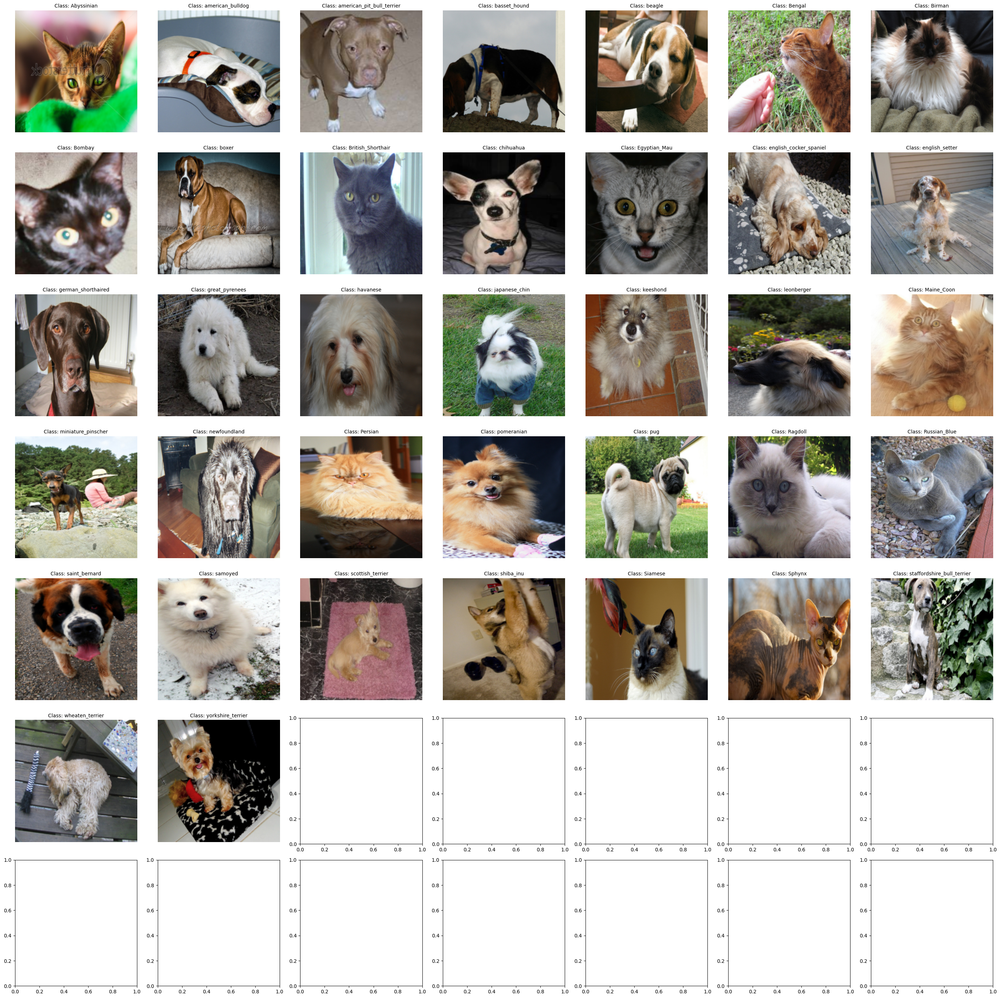

In [ ]:
from collections import Counter
import random
label_indices = [item[1] for item in full_dataset.data]

count_per_index = Counter(label_indices)
print(count_per_index)

class_distribution = {
    full_dataset.classes[index]: count
    for index, count in sorted(count_per_index.items())
}

print("\n" + "="*50)
print("Répartition des échantillons par classe (CLASS-ID)")
print("="*50)

max_class_len = max(len(c) for c in class_distribution.keys())
for class_id, count in class_distribution.items():
    print(f"Classe {class_id.ljust(max_class_len)} : {count} échantillons")

print("="*50)

num_classes = len(full_dataset.classes)

class_to_indices = {}
for idx, (_, label_index) in enumerate(full_dataset.data):
    if label_index not in class_to_indices:
        class_to_indices[label_index] = []
    class_to_indices[label_index].append(idx)

selected_indices = {
    label_index: random.choice(indices)
    for label_index, indices in class_to_indices.items()
}

grid_size = int(torch.ceil(torch.sqrt(torch.tensor(num_classes))).item())

fig, axes = plt.subplots(grid_size, grid_size, figsize=(4 * grid_size, 4 * grid_size))

if grid_size == 1:
    axes = [[axes]]
elif grid_size * grid_size > num_classes:
    axes = axes.flatten()

print(f"\nGénération d'un diagramme de {num_classes} images ({grid_size}x{grid_size} grille)...")

for i in range(num_classes):
    row = i // grid_size
    col = i % grid_size

    if i >= len(selected_indices):
        if grid_size == 1:
            ax = axes[0][0]
        elif grid_size * grid_size > num_classes:
            ax = axes[i]
        else:
            ax = axes[row, col]
        ax.axis('off')
        continue

    sample_idx = selected_indices[i]
    image_tensor, label_index = full_dataset[sample_idx]
    class_id = full_dataset.classes[label_index.item()]
    image_np = image_tensor.permute(1, 2, 0).numpy()
    if grid_size == 1:
        ax = axes[0][0]
    elif grid_size * grid_size > num_classes:
        ax = axes[i]
    else:
        ax = axes[row, col]

    ax.imshow(image_np)
    ax.set_title(f"Class: {class_id}", fontsize=10)
    ax.axis('off') 

plt.tight_layout()
plot_filename = 'images_par_classe.png'
plt.savefig(plot_filename)
print(f"\nImage enregistrée sous : {plot_filename}")
plt.show()

Nous observons que les races d'animal sont assez uniformément réparties.
Les images ont des fonds différents, et les animaux sont dans des positions différentes on peut avoir leur visage comme leurs corps car ce sont des images de la vie réelles et pas professionnelles. On observe également des variations d'éclairage et des occlusions des animaux, ce qui peut être particulièrement difficile pour l'apprentissage.



## Répartition par type


In [ ]:
import os
import torch
from torch.utils.data import Dataset
from PIL import Image


DRIVE_PATH = '/home/procope/ProjetHDDL/'
IMAGE_DIR = os.path.join(DRIVE_PATH, 'images') 
ANNOTATION_FILE = os.path.join(DRIVE_PATH, 'annotations', 'list.txt')


class OxfordDatasetType(Dataset):
    """
    Jeu de données pour la classification standard (1 image et 1 label par échantillon).
    """
    def __init__(self, image_dir, annotation_file, transform=None):
        self.image_dir = image_dir
        self.transform = transform
        self.classes = []
        self.data = self._load_data(annotation_file)

        print(f"Dataset initialisé. Nombre total d'échantillons: {len(self.data)}")


    def _load_data(self, annotation_file):
        """
        Analyse le fichier d'annotation au format Oxford-IIIT Pet (Image CLASS-ID SPECIES BREED ID).
        Utilise le CLASS-ID comme étiquette de classification.
        """
        data_list = []
        label_to_index = {}
        index_counter = 0

        try:
            with open(annotation_file, 'r') as f:
                for line in f:
                    if line.startswith('#') or not line.strip():
                        continue

                    parts = line.strip().split()

                    if len(parts) < 4:
                        print(f"Ligne ignorée (format incorrect): {line.strip()}")
                        continue

                    image_filename = parts[0] + ".jpg" 
                    class_id_str = parts[2]       

                    if class_id_str not in label_to_index:

                        label_to_index[class_id_str] = index_counter
  
                        self.classes.append(class_id_str)
                        index_counter += 1

                    label_index = label_to_index[class_id_str]

                    full_image_path = os.path.join(self.image_dir, image_filename)

                    if not os.path.exists(full_image_path):
                         full_image_path = os.path.join(self.image_dir, parts[0])

                         if not os.path.exists(full_image_path):
                            pass

                    data_list.append((full_image_path, label_index))

        except FileNotFoundError:
             print(f"ERREUR: Fichier d'annotation non trouvé à {annotation_file}.")
             return []
        print("INDEX COUNTER")
        print(index_counter)
        return data_list

    def __len__(self):
        """ Retourne le nombre total d'échantillons. """
        return len(self.data)

    def __getitem__(self, idx):
        """ Récupère un échantillon à l'index donné: (image, label_index). """

        img_path, label_index = self.data[idx]
        image = Image.open(img_path).convert('RGB')
        if self.transform:
            image = self.transform(image)
        return image, torch.tensor(label_index, dtype=torch.long)

In [ ]:
from torchvision import transforms

train_transforms = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.RandomCrop(224),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor()
    #transforms.Normalize(mean=[0.485, 0.456, 0.406],
    #                    std=[0.229, 0.224, 0.225])
])

eval_transforms = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.CenterCrop(224),
    transforms.ToTensor()
    #transforms.Normalize(mean=[0.485, 0.456, 0.406],
    #                     std=[0.229, 0.224, 0.225])
])

full_dataset_type = OxfordDatasetType(
    image_dir=IMAGE_DIR,
    annotation_file=ANNOTATION_FILE,
    transform=eval_transforms 
)

train_subset, val_subset_train_tf, test_subset_train_tf = create_data_splits(
    full_dataset=full_dataset_type,
    test_list_path=TEST_LIST_FILE,
    val_ratio=0.1
)


full_dataset_type = OxfordDatasetType(
    image_dir=IMAGE_DIR,
    annotation_file=ANNOTATION_FILE,
    transform=eval_transforms 
)

if val_subset_train_tf and test_subset_train_tf:
    val_indices = val_subset_train_tf.indices
    test_indices = test_subset_train_tf.indices

    val_subset = Subset(full_dataset_type, val_indices)
    test_subset = Subset(full_dataset_type, test_indices)
else:

    val_subset, test_subset = None, None
-
batch_size = 32
num_workers = 4

if train_subset and val_subset and test_subset:
    train_dataloader = DataLoader(train_subset, batch_size=batch_size, shuffle=True,
                                  num_workers=num_workers, pin_memory=True)

    val_dataloader = DataLoader(val_subset, batch_size=batch_size, shuffle=False,
                                num_workers=num_workers, pin_memory=True)

    test_dataloader = DataLoader(test_subset, batch_size=batch_size, shuffle=False,
                                 num_workers=num_workers, pin_memory=True)

    print("\n--- DataLoaders Créés avec Succès ---")
    print(f"Train Samples: {len(train_subset)} ({len(train_dataloader)} batches) - Transformations d'entraînement.")
    print(f"Validation Samples: {len(val_subset)} ({len(val_dataloader)} batches) - Transformations d'évaluation.")
    print(f"Test Samples: {len(test_subset)} ({len(test_dataloader)} batches) - Transformations d'évaluation.")
else:
     print("Échec de la création des DataLoaders en raison d'une erreur dans la division des données.")

INDEX COUNTER
2
Dataset initialisé. Nombre total d'échantillons: 7349
Indices identifiés : Train/Val = 3680 | Test = 3669
INDEX COUNTER
2
Dataset initialisé. Nombre total d'échantillons: 7349

--- DataLoaders Créés avec Succès ---
Train Samples: 3312 (104 batches) - Transformations d'entraînement.
Validation Samples: 368 (12 batches) - Transformations d'évaluation.
Test Samples: 3669 (115 batches) - Transformations d'évaluation.



Répartition des échantillons par espèce (Cat/Dog)
Espèce Cat : 2371 échantillons
Espèce Dog : 4978 échantillons

Génération d'un diagramme de 5 images par espèce (2x5 grille)...

Image enregistrée sous : images_par_espece.png


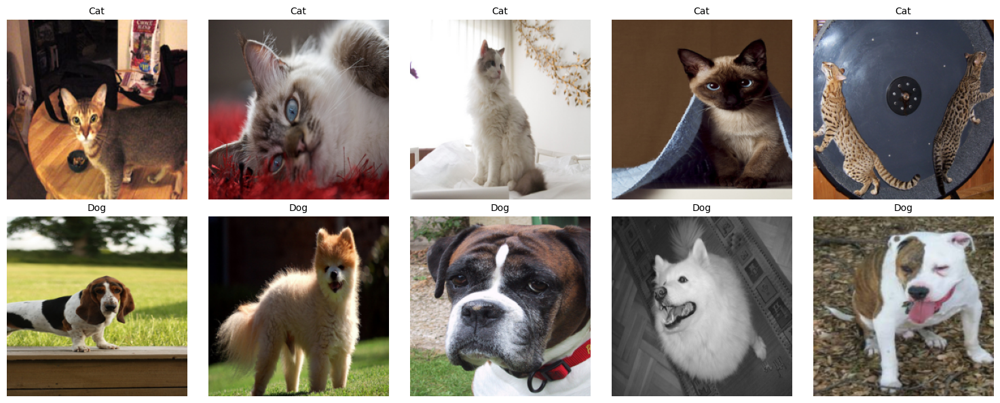

In [ ]:

from collections import Counter
import random
import matplotlib.pyplot as plt
import torch
import numpy as np 

label_indices = [item[1] for item in full_dataset_type.data]

species_names_map = {0: 'Cat', 1: 'Dog'}
count_per_index = Counter(label_indices)
class_distribution_for_print = {
    species_names_map[index]: count
    for index, count in sorted(count_per_index.items())
}

print("\n" + "="*50)
print("Répartition des échantillons par espèce (Cat/Dog)")
print("="*50)
max_class_len = max(len(name) for name in species_names_map.values())
for class_name, count in class_distribution_for_print.items():
    print(f"Espèce {class_name.ljust(max_class_len)} : {count} échantillons")

print("="*50)


num_classes = len(full_dataset_type.classes) 
num_images_to_plot_per_species = 5

class_to_indices = {}
for idx, (_, label_index) in enumerate(full_dataset_type.data):
    if label_index not in class_to_indices:
        class_to_indices[label_index] = []
    class_to_indices[label_index].append(idx)

selected_samples_per_species = {}
for label_index, indices in class_to_indices.items():
    num_to_sample = min(len(indices), num_images_to_plot_per_species)
    selected_samples_per_species[label_index] = random.sample(indices, num_to_sample)

nrows = num_classes
ncols = num_images_to_plot_per_species
fig, axes = plt.subplots(nrows, ncols, figsize=(3 * ncols, 3 * nrows))
axes = axes.flatten()

print(f"\nGénération d'un diagramme de {num_images_to_plot_per_species} images par espèce ({nrows}x{ncols} grille)...")

plot_idx = 0
for label_index in sorted(selected_samples_per_species.keys()):
    species_display_name = species_names_map[label_index]

    for sample_dataset_idx in selected_samples_per_species[label_index]:

        image_tensor, _ = full_dataset_type[sample_dataset_idx]

        image_np = image_tensor.permute(1, 2, 0).numpy()

        ax = axes[plot_idx]
        ax.imshow(image_np)
        ax.set_title(species_display_name, fontsize=10)
        ax.axis('off') 
        plot_idx += 1

while plot_idx < nrows * ncols:
    axes[plot_idx].axis('off')
    plot_idx += 1

plt.tight_layout()
plot_filename = 'images_par_espece.png'
plt.savefig(plot_filename)
print(f"\nImage enregistrée sous : {plot_filename}")
plt.show()


Nous observons que les deux classes ne sont pas uniformément réparties. Il y a 2 fois plus de chiens que de chats, cela va poser problème pour l'entrainementd e notre modèle car il va ainsi porter plus d'importance aux chiens qu'aux chats. 

# 
PARTIE 2 : Classification binaire

In [ ]:
from torchvision import transforms

train_transforms = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.RandomCrop(224),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                        std=[0.229, 0.224, 0.225])
])

eval_transforms = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.CenterCrop(224),
    transforms.ToTensor()
    #transforms.Normalize(mean=[0.485, 0.456, 0.406],
    #                     std=[0.229, 0.224, 0.225])
])


full_dataset_type = OxfordDatasetType(
    image_dir=IMAGE_DIR,
    annotation_file=ANNOTATION_FILE,
    transform=eval_transforms 
)

train_subset, val_subset_train_tf, test_subset_train_tf = create_data_splits(
    full_dataset=full_dataset_type,
    test_list_path=TEST_LIST_FILE,
    val_ratio=0.1
)


if val_subset_train_tf and test_subset_train_tf:

    val_indices = val_subset_train_tf.indices
    test_indices = test_subset_train_tf.indices

    val_subset = Subset(full_dataset_type, val_indices)
    test_subset = Subset(full_dataset_type, test_indices)
else:
    val_subset, test_subset = None, None

batch_size = 32
num_workers = 4

if train_subset and val_subset and test_subset:
    
    train_dataloader = DataLoader(train_subset, batch_size=batch_size, shuffle=True,
                                  num_workers=num_workers, pin_memory=True)

    val_dataloader = DataLoader(val_subset, batch_size=batch_size, shuffle=False,
                                num_workers=num_workers, pin_memory=True)
    test_dataloader = DataLoader(test_subset, batch_size=batch_size, shuffle=False,
                                 num_workers=num_workers, pin_memory=True)

    print("\n--- DataLoaders Créés avec Succès ---")
    print(f"Train Samples: {len(train_subset)} ({len(train_dataloader)} batches) - Transformations d'entraînement.")
    print(f"Validation Samples: {len(val_subset)} ({len(val_dataloader)} batches) - Transformations d'évaluation.")
    print(f"Test Samples: {len(test_subset)} ({len(test_dataloader)} batches) - Transformations d'évaluation.")
else:
     print("Échec de la création des DataLoaders en raison d'une erreur dans la division des données.")

INDEX COUNTER
2
Dataset initialisé. Nombre total d'échantillons: 7349
Indices identifiés : Train/Val = 3680 | Test = 3669

--- DataLoaders Créés avec Succès ---
Train Samples: 3312 (104 batches) - Transformations d'entraînement.
Validation Samples: 368 (12 batches) - Transformations d'évaluation.
Test Samples: 3669 (115 batches) - Transformations d'évaluation.


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class CNNChatChien(nn.Module):
    def __init__(self):
        super().__init__()

        # Feature extractor
        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.pool = nn.MaxPool2d(2, 2)

        # Classifier
        self.fc1 = nn.Linear(128 * 28 * 28, 256)  
        self.fc2 = nn.Linear(256, 1)
        self.dropout = nn.Dropout(0.5)

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = self.pool(F.relu(self.conv3(x)))

        x = torch.flatten(x, 1)
        x = F.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.fc2(x)      

        return x


Nous avons utilisé un CNN pour la classification binaire car le CNN découpe l'image en morceaux, apprend les caractéristiques importantes couche après couche et prend ensuite une décision : chat ou chien.

Voici à quoi servent les différentes couches. 

Couches de Convolution : Elles agissent comme des détecteurs, apprenant et extrayant les caractéristiques visuelles de l'image (des bords simples aux formes complexes).

Couches de Pooling : Elles simplifient les données en réduisant la taille des cartes de caractéristiques, ce qui accélère le calcul et rend le modèle plus résistant aux légers décalages.

Couches Denses (Classifieur) : Elles prennent les caractéristiques extraites en entrée et déterminent la probabilité finale que l'image soit un chat ou un chien.

In [21]:
labels_all = []
for _, labels in train_dataloader:
    labels_all.append(labels)

labels_all = torch.cat(labels_all)
print(labels_all.min(), labels_all.max())
print(labels_all.unique())


tensor(0) tensor(1)
tensor([0, 1])


In [22]:
import torch
import torch.nn as nn

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = CNNChatChien().to(device)

criterion = nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)


Dans la classification binaire (comme Chat vs Chien), le but est que le réseau produise une probabilité p comprise entre 0 et 1, indiquant la chance que l'image appartienne à la classe positive (par exemple, le Chien).

La fonction de perte la plus courante pour ce type de problème est la Binary Cross-Entropy (BCE).
La fonction BCEWithLogitsLoss() contient le sigmoid + la binary cross entropy

In [40]:
import copy
import torch

def train_model(model, train_loader, val_loader, criterion, optimizer, 
                num_epochs=10):

    history = {
        "train_loss": [],
        "train_acc": [],
        "val_loss": [],
        "val_acc": []
    }

    best_val_loss = float("inf")
    best_model_wts = copy.deepcopy(model.state_dict())

    for epoch in range(num_epochs):

        model.train()
        train_loss = 0.0
        train_correct = 0
        train_total = 0

        for images, labels in train_loader:
            images = images.to(device)
            labels = labels.float().to(device)

            optimizer.zero_grad()
            outputs = model(images).squeeze(1)
            loss = criterion(outputs, labels)

            loss.backward()
            optimizer.step()

            train_loss += loss.item()

            preds = (torch.sigmoid(outputs) > 0.5).float()
            train_correct += (preds == labels).sum().item()
            train_total += labels.size(0)

        train_loss /= len(train_loader)
        train_acc = train_correct / train_total

        model.eval()
        val_loss = 0.0
        val_correct = 0
        val_total = 0

        with torch.no_grad():
            for images, labels in val_loader:
                images = images.to(device)
                labels = labels.float().to(device)

                outputs = model(images).squeeze(1)
                loss = criterion(outputs, labels)

                val_loss += loss.item()

                preds = (torch.sigmoid(outputs) > 0.5).float()
                val_correct += (preds == labels).sum().item()
                val_total += labels.size(0)

        val_loss /= len(val_loader)
        val_acc = val_correct / val_total

        history["train_loss"].append(train_loss)
        history["train_acc"].append(train_acc)
        history["val_loss"].append(val_loss)
        history["val_acc"].append(val_acc)

        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_wts = copy.deepcopy(model.state_dict())
            torch.save(best_model_wts, "/home/procope/ProjetHDDL/best_model.pth")

        print(
            f"Epoch [{epoch+1}/{num_epochs}] | "
            f"Train Loss: {train_loss:.4f} | Train Acc: {train_acc:.4f} | "
            f"Val Loss: {val_loss:.4f} | Val Acc: {val_acc:.4f}"
        )

    model.load_state_dict(best_model_wts)

    return model, history


In [24]:
model, history = train_model(
    model,
    train_dataloader,
    val_dataloader,
    criterion,
    optimizer,
    num_epochs=20
)


Epoch [1/20] | Train Loss: 0.6472 | Train Acc: 0.6685 | Val Loss: 0.6158 | Val Acc: 0.6902
Epoch [2/20] | Train Loss: 0.6077 | Train Acc: 0.6763 | Val Loss: 0.5937 | Val Acc: 0.7011
Epoch [3/20] | Train Loss: 0.5877 | Train Acc: 0.6935 | Val Loss: 0.5800 | Val Acc: 0.7065
Epoch [4/20] | Train Loss: 0.5601 | Train Acc: 0.7165 | Val Loss: 0.5570 | Val Acc: 0.7147
Epoch [5/20] | Train Loss: 0.5127 | Train Acc: 0.7421 | Val Loss: 0.5599 | Val Acc: 0.7364
Epoch [6/20] | Train Loss: 0.4776 | Train Acc: 0.7766 | Val Loss: 0.5614 | Val Acc: 0.7174
Epoch [7/20] | Train Loss: 0.4317 | Train Acc: 0.7977 | Val Loss: 0.6005 | Val Acc: 0.7310
Epoch [8/20] | Train Loss: 0.3750 | Train Acc: 0.8333 | Val Loss: 0.5931 | Val Acc: 0.7473
Epoch [9/20] | Train Loss: 0.3095 | Train Acc: 0.8696 | Val Loss: 0.7599 | Val Acc: 0.7337
Epoch [10/20] | Train Loss: 0.2351 | Train Acc: 0.9058 | Val Loss: 0.7574 | Val Acc: 0.7283
Epoch [11/20] | Train Loss: 0.1817 | Train Acc: 0.9236 | Val Loss: 0.9459 | Val Acc: 0.74

In [41]:
def plot_history(history):
    import matplotlib.pyplot as plt

    plt.figure()
    plt.plot(history["train_loss"], label="Train Loss")
    plt.plot(history["val_loss"], label="Val Loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title("Loss vs Epochs")
    plt.legend()
    plt.grid(True)
    plt.show()
    plt.figure()
    plt.plot(history["train_acc"], label="Train Accuracy")
    plt.plot(history["val_acc"], label="Val Accuracy")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.title("Accuracy vs Epochs")
    plt.legend()
    plt.grid(True)
    plt.show()


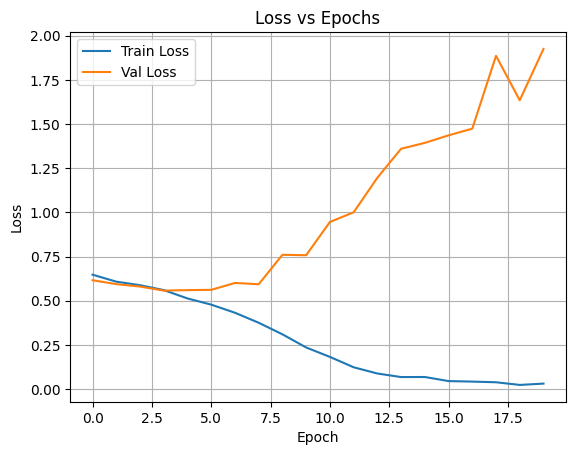

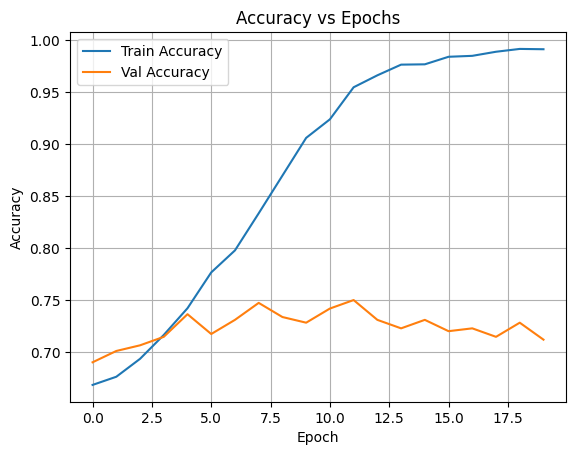

In [27]:
plot_history(history)

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

def plot_confusion_matrix(model, dataloader, device, class_names=["Chat", "Chien"]):
    model.eval()

    y_true = []
    y_pred = []

    with torch.no_grad():
        for images, labels in dataloader:
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images).squeeze(1)
            probs = torch.sigmoid(outputs)
            preds = (probs > 0.5).int()

            y_true.extend(labels.cpu().numpy())
            y_pred.extend(preds.cpu().numpy())

    y_true = np.array(y_true)
    y_pred = np.array(y_pred)

    # Matrice de confusion
    cm = confusion_matrix(y_true, y_pred)
    print("Confusion Matrix:\n", cm)

    # Calcul de l'accuracy
    accuracy = (y_true == y_pred).sum() / len(y_true) * 100
    print(f"Accuracy: {accuracy:.2f}%")

    # Plot
    plt.figure(figsize=(5,5))
    plt.imshow(cm, cmap=plt.cm.Blues)
    plt.colorbar()
    plt.xticks([0, 1], class_names)
    plt.yticks([0, 1], class_names)
    plt.xlabel("Predicted")
    plt.ylabel("True")

    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            plt.text(j, i, cm[i, j], ha="center", va="center", color="red", fontsize=14)

    plt.title(f"Confusion Matrix - Accuracy: {accuracy:.2f}%")
    plt.show()

    return cm, y_true, y_pred


Confusion Matrix:
 [[ 453  730]
 [ 264 2222]]
Accuracy: 72.91%


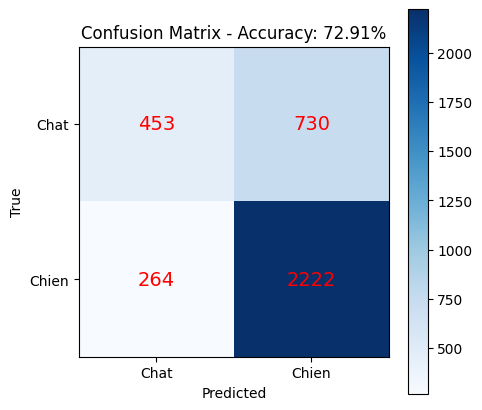

In [29]:

cm, y_true, y_pred = plot_confusion_matrix(model, test_dataloader, device, class_names=["Chat", "Chien"])


On remarque que notre dataset est pas bien balancé on a 2 fois plus de Chiens que de chats il faut donc ajouter une pondération à la perte car le modèle tend à tout classer en chien pour augmenter l'accuracy.

On doit échanger les labels pour ajouter un poids de pondération sur les chats

In [ ]:
class OxfordDatasetType(Dataset):
    """
    Jeu de données pour la classification standard (1 image et 1 label par échantillon).
    """
    def __init__(self, image_dir, annotation_file, transform=None):
        self.image_dir = image_dir
        self.transform = transform
        self.classes = []
        self.data = self._load_data(annotation_file)

        print(f"Dataset initialisé. Nombre total d'échantillons: {len(self.data)}")


    def _load_data(self, annotation_file):
        data_list = []
        label_to_index = {}
        index_counter = 0

        try:
            with open(annotation_file, 'r') as f:
                for line in f:
                    if line.startswith('#') or not line.strip():
                        continue

                    parts = line.strip().split()

                    if len(parts) < 4:
                        print(f"Ligne ignorée (format incorrect): {line.strip()}")
                        continue

                    image_filename = parts[0] + ".jpg" 
                    class_id_str = parts[2]            

                    if class_id_str not in label_to_index:
                        label_to_index[class_id_str] = index_counter
                        self.classes.append(class_id_str)
                        index_counter += 1

                    label_index = label_to_index[class_id_str]
                    full_image_path = os.path.join(self.image_dir, image_filename)

                    if not os.path.exists(full_image_path):
                         full_image_path = os.path.join(self.image_dir, parts[0])

                         if not os.path.exists(full_image_path):
                            pass

                    data_list.append((full_image_path, label_index))

        except FileNotFoundError:
             print(f"ERREUR: Fichier d'annotation non trouvé à {annotation_file}.")
             return []
        return data_list

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        img_path, label = self.data[idx]
        image = Image.open(img_path).convert("RGB")
        if self.transform:
            image = self.transform(image)
        
        # Inversion des labels : chats=1, chiens=0
        label = 1 - label   # si chats=0, chiens=1 dans les annotations d'origine
        
        return image, label

In [ ]:
from torchvision import transforms

train_transforms = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.RandomCrop(224),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                        std=[0.229, 0.224, 0.225])
])

eval_transforms = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.CenterCrop(224),
    transforms.ToTensor()
    #transforms.Normalize(mean=[0.485, 0.456, 0.406],
    #                     std=[0.229, 0.224, 0.225])
])


full_dataset_type = OxfordDatasetType(
    image_dir=IMAGE_DIR,
    annotation_file=ANNOTATION_FILE,
    transform=eval_transforms 
)

train_subset, val_subset_train_tf, test_subset_train_tf = create_data_splits(
    full_dataset=full_dataset_type,
    test_list_path=TEST_LIST_FILE,
    val_ratio=0.1
)


if val_subset_train_tf and test_subset_train_tf:

    val_indices = val_subset_train_tf.indices
    test_indices = test_subset_train_tf.indices

    val_subset = Subset(full_dataset_type, val_indices)
    test_subset = Subset(full_dataset_type, test_indices)
else:
    val_subset, test_subset = None, None

batch_size = 32
num_workers = 4

if train_subset and val_subset and test_subset:
    
    train_dataloader = DataLoader(train_subset, batch_size=batch_size, shuffle=True,
                                  num_workers=num_workers, pin_memory=True)

    val_dataloader = DataLoader(val_subset, batch_size=batch_size, shuffle=False,
                                num_workers=num_workers, pin_memory=True)
    test_dataloader = DataLoader(test_subset, batch_size=batch_size, shuffle=False,
                                 num_workers=num_workers, pin_memory=True)

    print("\n--- DataLoaders Créés avec Succès ---")
    print(f"Train Samples: {len(train_subset)} ({len(train_dataloader)} batches) - Transformations d'entraînement.")
    print(f"Validation Samples: {len(val_subset)} ({len(val_dataloader)} batches) - Transformations d'évaluation.")
    print(f"Test Samples: {len(test_subset)} ({len(test_dataloader)} batches) - Transformations d'évaluation.")
else:
     print("Échec de la création des DataLoaders en raison d'une erreur dans la division des données.")


INDEX COUNTER
2
Dataset initialisé. Nombre total d'échantillons: 7349
Indices identifiés : Train/Val = 3680 | Test = 3669

--- DataLoaders Créés avec Succès ---
Train Samples: 3312 (104 batches) - Transformations d'entraînement.
Validation Samples: 368 (12 batches) - Transformations d'évaluation.
Test Samples: 3669 (115 batches) - Transformations d'évaluation.


In [ ]:
import torch

labels_all = torch.tensor([label for _, label in train_subset])

n_chiens = (labels_all == 0).sum()
n_chats = (labels_all == 1).sum()
print(n_chiens)
print(n_chats)
pos_weight = n_chiens / n_chats
print("pos_weight =", pos_weight.item())

criterion = nn.BCEWithLogitsLoss(pos_weight=torch.tensor([pos_weight]).to("cuda"))

tensor(2238)
tensor(1074)
pos_weight = 2.083798885345459


In [48]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = CNNChatChien().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)


In [49]:
model, history = train_model(
    model,
    train_dataloader,
    val_dataloader,
    criterion,
    optimizer,
    num_epochs=20
)


Epoch [1/20] | Train Loss: 0.9622 | Train Acc: 0.4526 | Val Loss: 0.9124 | Val Acc: 0.5815
Epoch [2/20] | Train Loss: 0.9220 | Train Acc: 0.5531 | Val Loss: 0.9211 | Val Acc: 0.5897
Epoch [3/20] | Train Loss: 0.8949 | Train Acc: 0.6205 | Val Loss: 0.8730 | Val Acc: 0.6005
Epoch [4/20] | Train Loss: 0.8409 | Train Acc: 0.6528 | Val Loss: 0.8353 | Val Acc: 0.6413
Epoch [5/20] | Train Loss: 0.7647 | Train Acc: 0.7008 | Val Loss: 0.8258 | Val Acc: 0.6495
Epoch [6/20] | Train Loss: 0.7003 | Train Acc: 0.7418 | Val Loss: 0.8686 | Val Acc: 0.6848
Epoch [7/20] | Train Loss: 0.6003 | Train Acc: 0.7908 | Val Loss: 0.9875 | Val Acc: 0.6277
Epoch [8/20] | Train Loss: 0.5073 | Train Acc: 0.8273 | Val Loss: 1.0427 | Val Acc: 0.6957
Epoch [9/20] | Train Loss: 0.4170 | Train Acc: 0.8659 | Val Loss: 1.2419 | Val Acc: 0.6902
Epoch [10/20] | Train Loss: 0.2787 | Train Acc: 0.9064 | Val Loss: 1.4532 | Val Acc: 0.6929
Epoch [11/20] | Train Loss: 0.2058 | Train Acc: 0.9390 | Val Loss: 1.6883 | Val Acc: 0.71

Confusion Matrix:
 [[1725  761]
 [ 373  810]]
Accuracy: 69.09%


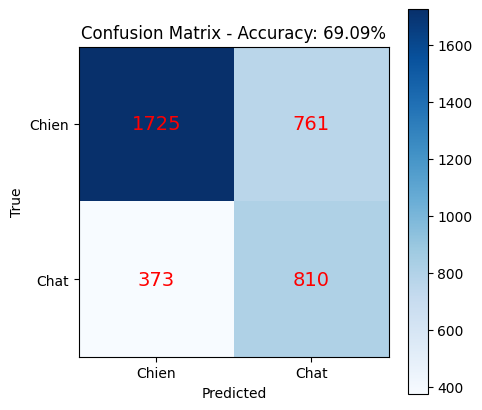

In [50]:

cm, y_true, y_pred = plot_confusion_matrix(model, test_dataloader, device, class_names=["Chien", "Chat"])


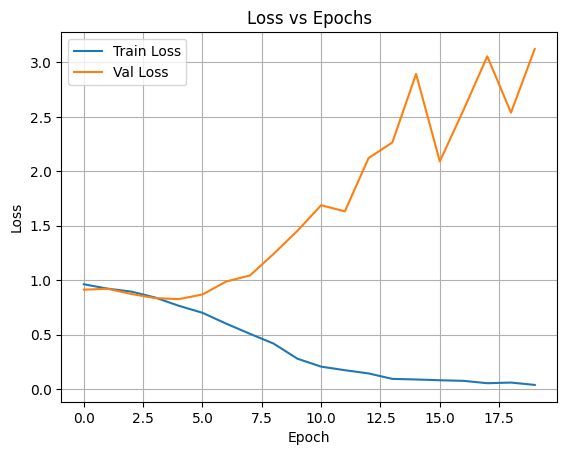

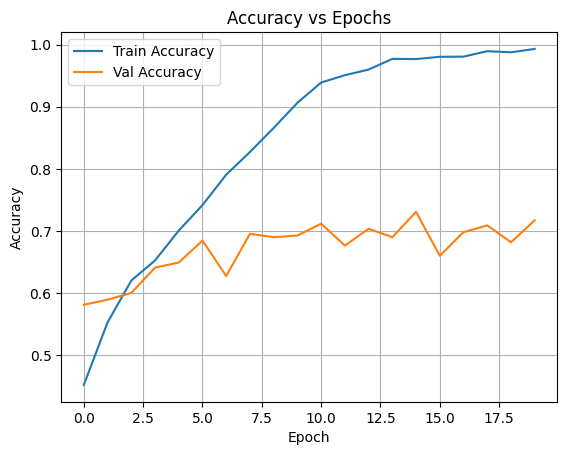

In [51]:
plot_history(history)

On remarque de l'overfitting ici, notre modèle a déjà du drop out, il est trop simple pour nos données. Il pénalise aussi trop les chiens maintenant qu'on a ajouté le poids.

CNN Improved

In [52]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class CNNChatChienImproved(nn.Module):
    def __init__(self):
        super().__init__()

        # Bloc 1
        self.conv1 = nn.Conv2d(3, 32, 3, padding=1)
        self.bn1 = nn.BatchNorm2d(32)
        self.conv2 = nn.Conv2d(32, 32, 3, padding=1)
        self.bn2 = nn.BatchNorm2d(32)
        self.pool1 = nn.MaxPool2d(2,2)  # 224 -> 112

        # Bloc 2
        self.conv3 = nn.Conv2d(32, 64, 3, padding=1)
        self.bn3 = nn.BatchNorm2d(64)
        self.conv4 = nn.Conv2d(64, 64, 3, padding=1)
        self.bn4 = nn.BatchNorm2d(64)
        self.pool2 = nn.MaxPool2d(2,2)  # 112 -> 56

        # Bloc 3
        self.conv5 = nn.Conv2d(64, 128, 3, padding=1)
        self.bn5 = nn.BatchNorm2d(128)
        self.pool3 = nn.MaxPool2d(2,2)  # 56 -> 28

        # Bloc 4
        self.conv6 = nn.Conv2d(128, 256, 3, padding=1)
        self.bn6 = nn.BatchNorm2d(256)
        self.pool4 = nn.AdaptiveAvgPool2d((7,7))  # 28 -> 7

        self.dropout = nn.Dropout(0.5)

        # Classifier
        self.fc1 = nn.Linear(256*7*7, 256)
        self.fc2 = nn.Linear(256, 1)

    def forward(self, x):
        x = F.relu(self.bn1(self.conv1(x)))
        x = F.relu(self.bn2(self.conv2(x)))
        x = self.pool1(x)

        x = F.relu(self.bn3(self.conv3(x)))
        x = F.relu(self.bn4(self.conv4(x)))
        x = self.pool2(x)

        x = F.relu(self.bn5(self.conv5(x)))
        x = self.pool3(x)

        x = F.relu(self.bn6(self.conv6(x)))
        x = self.pool4(x)

        x = torch.flatten(x, 1)
        x = F.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.fc2(x)
        return x


L'ajout de la Batch Normalization avant l'activation ReLU aide pour stabiliser et accélérer l'apprentissage du réseau.

In [53]:
criterion = nn.BCEWithLogitsLoss(pos_weight=torch.tensor([pos_weight]).to(device))

In [54]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = CNNChatChienImproved().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

In [55]:
model, history = train_model(
    model,
    train_dataloader,
    val_dataloader,
    criterion,
    optimizer,
    num_epochs=20
)


Epoch [1/20] | Train Loss: 1.1459 | Train Acc: 0.5423 | Val Loss: 0.8921 | Val Acc: 0.5027
Epoch [2/20] | Train Loss: 0.8866 | Train Acc: 0.5972 | Val Loss: 0.8289 | Val Acc: 0.6821
Epoch [3/20] | Train Loss: 0.8588 | Train Acc: 0.6322 | Val Loss: 0.8051 | Val Acc: 0.6821
Epoch [4/20] | Train Loss: 0.7974 | Train Acc: 0.6833 | Val Loss: 0.8143 | Val Acc: 0.6549
Epoch [5/20] | Train Loss: 0.7804 | Train Acc: 0.7074 | Val Loss: 0.7649 | Val Acc: 0.7011
Epoch [6/20] | Train Loss: 0.7359 | Train Acc: 0.7385 | Val Loss: 0.7126 | Val Acc: 0.7174
Epoch [7/20] | Train Loss: 0.7197 | Train Acc: 0.7482 | Val Loss: 0.7272 | Val Acc: 0.7582
Epoch [8/20] | Train Loss: 0.6950 | Train Acc: 0.7609 | Val Loss: 1.0744 | Val Acc: 0.5489
Epoch [9/20] | Train Loss: 0.6801 | Train Acc: 0.7624 | Val Loss: 0.7341 | Val Acc: 0.6793
Epoch [10/20] | Train Loss: 0.6525 | Train Acc: 0.7793 | Val Loss: 0.6683 | Val Acc: 0.7636
Epoch [11/20] | Train Loss: 0.6178 | Train Acc: 0.7805 | Val Loss: 0.6885 | Val Acc: 0.70

Confusion Matrix:
 [[1884  602]
 [ 181 1002]]
Accuracy: 78.66%


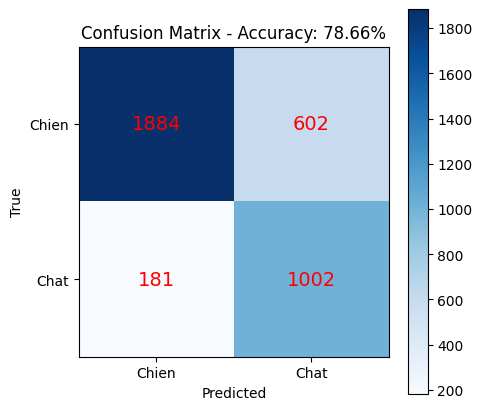

In [57]:

cm, y_true, y_pred = plot_confusion_matrix(model, test_dataloader, device, class_names=["Chien", "Chat"])

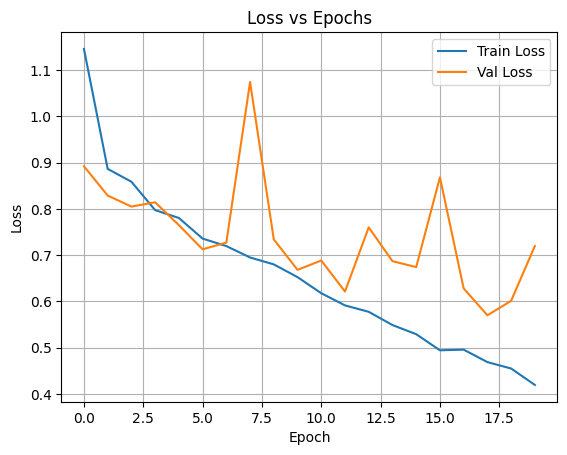

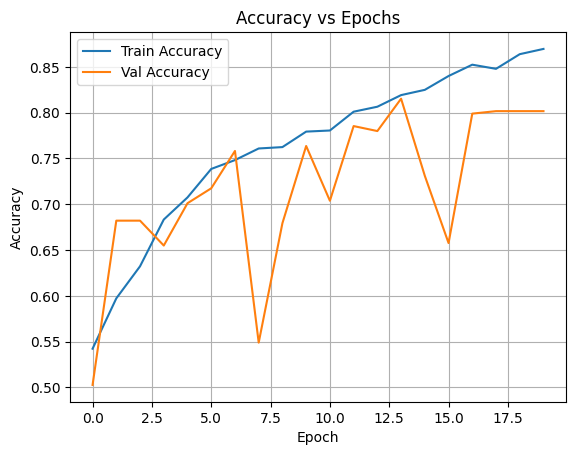

In [58]:
plot_history(history)

In [59]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = CNNChatChienImproved().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
criterion = nn.BCEWithLogitsLoss(pos_weight=torch.tensor([pos_weight]).to(device))

In [60]:
model, history = train_model(
    model,
    train_dataloader,
    val_dataloader,
    criterion,
    optimizer,
    num_epochs=40
)


Epoch [1/40] | Train Loss: 1.0946 | Train Acc: 0.5628 | Val Loss: 0.9203 | Val Acc: 0.4321
Epoch [2/40] | Train Loss: 0.9105 | Train Acc: 0.5713 | Val Loss: 0.8753 | Val Acc: 0.6902
Epoch [3/40] | Train Loss: 0.8581 | Train Acc: 0.6431 | Val Loss: 0.8362 | Val Acc: 0.6005
Epoch [4/40] | Train Loss: 0.8260 | Train Acc: 0.6766 | Val Loss: 0.8088 | Val Acc: 0.6630
Epoch [5/40] | Train Loss: 0.8025 | Train Acc: 0.6941 | Val Loss: 0.8267 | Val Acc: 0.6250
Epoch [6/40] | Train Loss: 0.7738 | Train Acc: 0.7195 | Val Loss: 0.7570 | Val Acc: 0.7283
Epoch [7/40] | Train Loss: 0.7864 | Train Acc: 0.7183 | Val Loss: 0.7882 | Val Acc: 0.6875
Epoch [8/40] | Train Loss: 0.7619 | Train Acc: 0.7325 | Val Loss: 0.7364 | Val Acc: 0.6984
Epoch [9/40] | Train Loss: 0.7292 | Train Acc: 0.7494 | Val Loss: 0.9771 | Val Acc: 0.7092
Epoch [10/40] | Train Loss: 0.7207 | Train Acc: 0.7542 | Val Loss: 0.6791 | Val Acc: 0.7745
Epoch [11/40] | Train Loss: 0.6847 | Train Acc: 0.7726 | Val Loss: 0.7084 | Val Acc: 0.76

Confusion Matrix:
 [[2058  428]
 [ 230  953]]
Accuracy: 82.07%


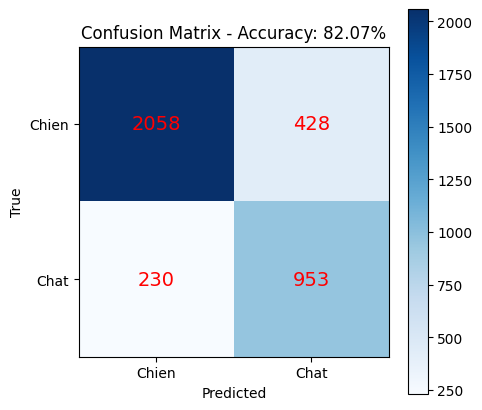

In [61]:

cm, y_true, y_pred = plot_confusion_matrix(model, test_dataloader, device, class_names=["Chien", "Chat"])

Avec trop d'epoch on commence à perdre la précision sur la classe minoritaire

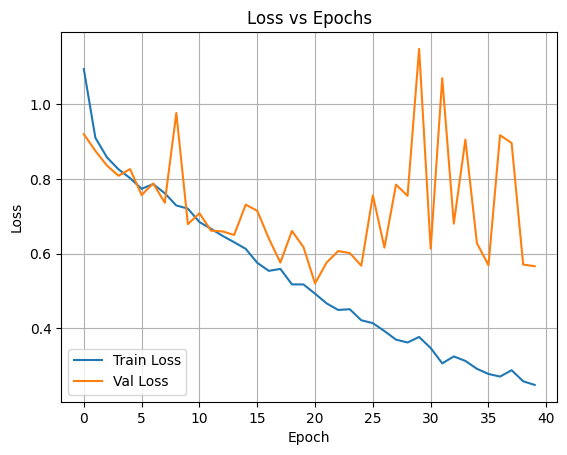

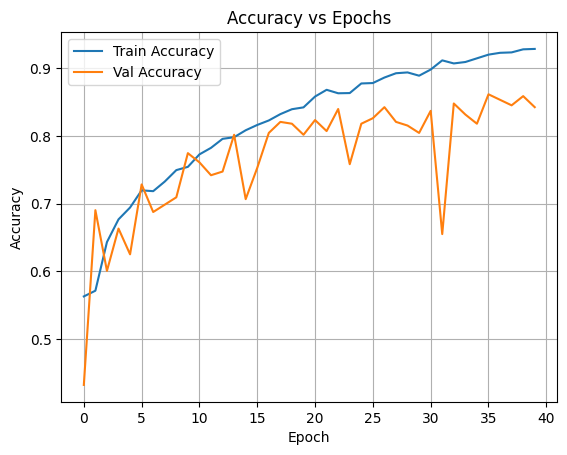

In [62]:
plot_history(history)

## Modèles pré-entrainés

### VGG-16

Comme modèle préentrainé on utilise VGG-16, on va donc geler ses couches de convolution et ensuite appliquer notrre classifier pour avoir uniquement 2 classes en sortie. On va ensuite le fine - tuner sur quelques epoch. Comme VGG-16 est entrainé sur les données d'Image Net il a appris à bien extraire les caractéristiques des différentes classes comme chien et chat.

In [ ]:
import torch
import torch.nn as nn
from torchvision import models

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

vgg = models.vgg16(pretrained=True)

for param in vgg.features.parameters():
    param.requires_grad = False

# Modifier le classifieur pour binaire
vgg.classifier[6] = nn.Linear(4096, 1)

model = vgg.to(device)


/home/procope/.conda/envs/HDDLtorch/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/procope/.conda/envs/HDDLtorch/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [ ]:
import torch
labels_all = torch.tensor([label for _, label in train_subset])

n_chiens = (labels_all == 0).sum()   # majoritaire
n_chats = (labels_all == 1).sum()  # minoritaire
print(n_chats)
print(n_chiens)
pos_weight = n_chiens / n_chats     # >1 pour classe minoritaire
print("pos_weight =", pos_weight.item())

criterion = nn.BCEWithLogitsLoss(pos_weight=torch.tensor([pos_weight]).to(device))


tensor(2238)
tensor(1074)
pos_weight = 0.479892760515213


In [21]:
import torch.optim as optim

optimizer = optim.Adam(vgg.classifier.parameters(), lr=1e-4)


In [22]:
model, history = train_model(model, train_dataloader, val_dataloader, criterion, optimizer, num_epochs=5)


Epoch [1/5] | Train Loss: 0.0739 | Train Acc: 0.9550 | Val Loss: 0.0367 | Val Acc: 0.9728
Epoch [2/5] | Train Loss: 0.0143 | Train Acc: 0.9928 | Val Loss: 0.0468 | Val Acc: 0.9783
Epoch [3/5] | Train Loss: 0.0072 | Train Acc: 0.9964 | Val Loss: 0.0577 | Val Acc: 0.9728
Epoch [4/5] | Train Loss: 0.0019 | Train Acc: 0.9994 | Val Loss: 0.1810 | Val Acc: 0.9321
Epoch [5/5] | Train Loss: 0.0097 | Train Acc: 0.9949 | Val Loss: 0.1152 | Val Acc: 0.9429


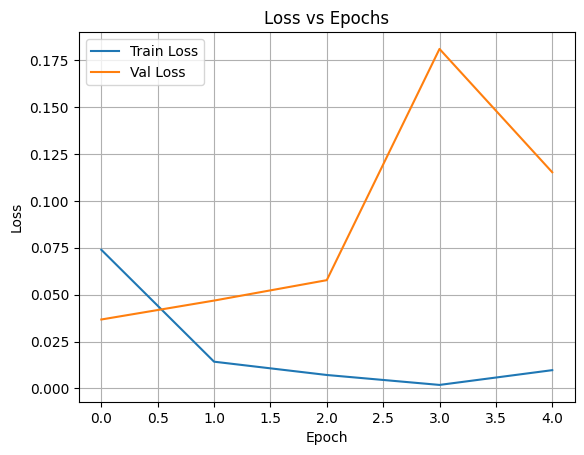

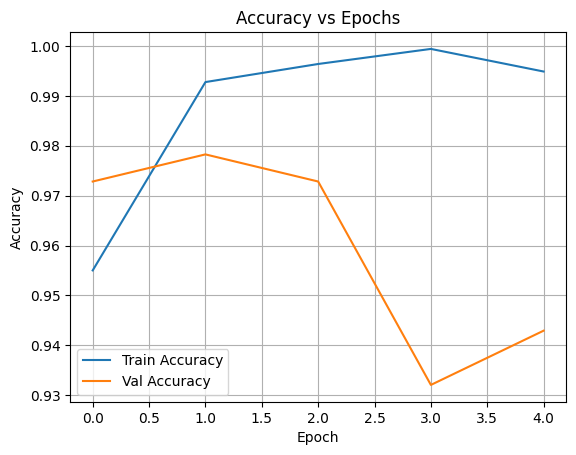

In [23]:
plot_history(history)

Confusion Matrix:
 [[1148   35]
 [  48 2438]]
Accuracy: 97.74%


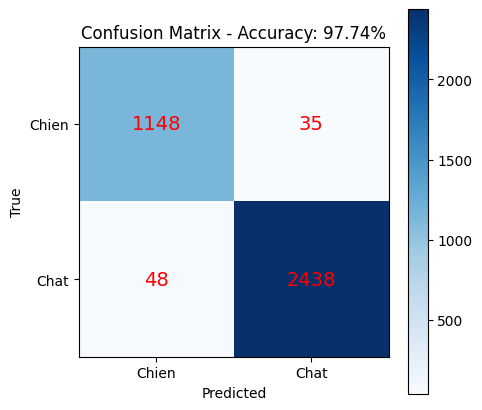

In [25]:
cm, y_true, y_pred = plot_confusion_matrix(model, test_dataloader, device, class_names=["Chien", "Chat"])


On a une très bonne accuracy de notre modèle. C'est ce à quoi on pouvait s'attendre, de meilleurs resultats que nos réseaux qui ne sont pas pré entrainés et qui ont que le eu de données dont nous disposons pour apprendre les caractéristiques des différentes classes.

In [ ]:
import torch
import torch.nn as nn
from torchvision import models

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Charger VGG16 pré-entraîné
vgg = models.vgg16(pretrained=True)

# Geler les features pour ne pas entraîner tout le réseau
for param in vgg.features.parameters():
    param.requires_grad = False

# Modifier le classifieur pour binaire
vgg.classifier[6] = nn.Linear(4096, 1)

model = vgg.to(device)


/home/procope/.conda/envs/HDDLtorch/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/procope/.conda/envs/HDDLtorch/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /home/procope/.cache/torch/hub/checkpoints/vgg16-397923af.pth


100%|██████████| 528M/528M [00:04<00:00, 116MB/s]  


In [ ]:
import torch

labels_all = torch.tensor([label for _, label in train_subset])

n_chats = (labels_all == 0).sum()   # minoritaire
n_chiens = (labels_all == 1).sum()  # majoritaire
print(n_chats)
print(n_chiens)
pos_weight = n_chiens / n_chats     # >1 pour classe minoritaire
print("pos_weight =", pos_weight.item())

criterion = nn.BCEWithLogitsLoss(pos_weight=torch.tensor([pos_weight]).to(device))


tensor(1074)
tensor(2238)
pos_weight = 2.083798885345459


In [ ]:
import torch.optim as optim

optimizer = optim.Adam(vgg.classifier.parameters(), lr=1e-4)


In [ ]:
model, history = train_model(model, train_dataloader, val_dataloader, criterion, optimizer, num_epochs=20)


Epoch [1/20] | Train Loss: 0.0305 | Train Acc: 0.9915 | Val Loss: 0.1210 | Val Acc: 0.9620
Epoch [2/20] | Train Loss: 0.0158 | Train Acc: 0.9943 | Val Loss: 0.1669 | Val Acc: 0.9620
Epoch [3/20] | Train Loss: 0.0037 | Train Acc: 0.9988 | Val Loss: 0.1613 | Val Acc: 0.9647
Epoch [4/20] | Train Loss: 0.0018 | Train Acc: 0.9994 | Val Loss: 0.1790 | Val Acc: 0.9647
Epoch [5/20] | Train Loss: 0.0012 | Train Acc: 0.9997 | Val Loss: 0.1830 | Val Acc: 0.9674
Epoch [6/20] | Train Loss: 0.0004 | Train Acc: 1.0000 | Val Loss: 0.1772 | Val Acc: 0.9647
Epoch [7/20] | Train Loss: 0.0001 | Train Acc: 1.0000 | Val Loss: 0.2140 | Val Acc: 0.9674
Epoch [8/20] | Train Loss: 0.0022 | Train Acc: 0.9994 | Val Loss: 0.1673 | Val Acc: 0.9701
Epoch [9/20] | Train Loss: 0.0849 | Train Acc: 0.9846 | Val Loss: 0.1842 | Val Acc: 0.9620
Epoch [10/20] | Train Loss: 0.0337 | Train Acc: 0.9925 | Val Loss: 0.2575 | Val Acc: 0.9592
Epoch [11/20] | Train Loss: 0.0242 | Train Acc: 0.9958 | Val Loss: 0.1900 | Val Acc: 0.97

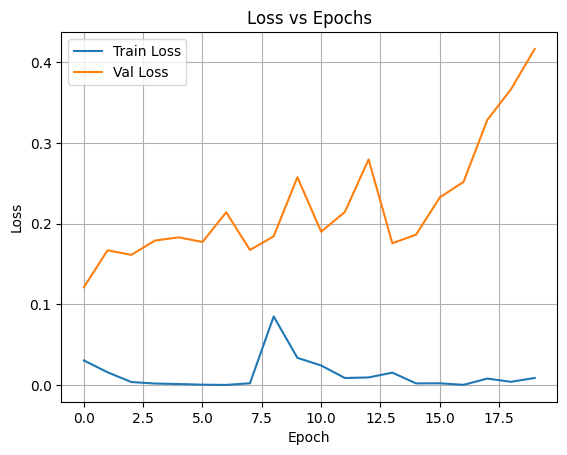

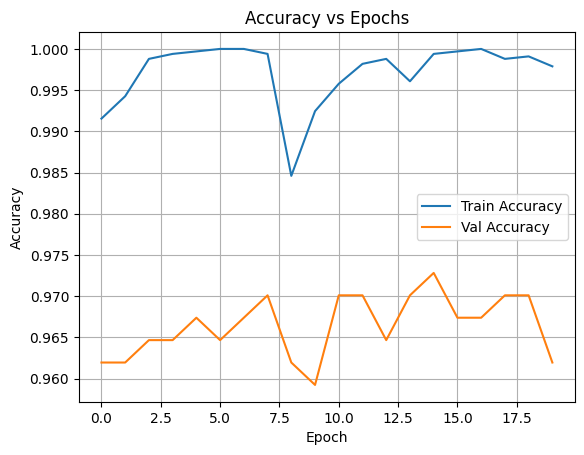

In [42]:
plot_history(history)

Confusion Matrix:
 [[1059  124]
 [  13 2473]]
Accuracy: 96.27%


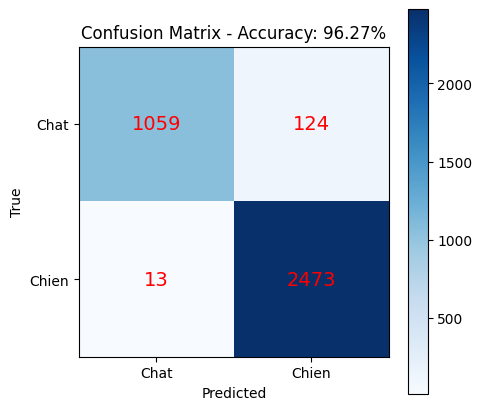

In [44]:
cm, y_true, y_pred = plot_confusion_matrix(model, test_dataloader, device, class_names=["Chat", "Chien"])
